In [1]:
import os
from typing import *
from PIL import Image
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from glob import glob

import torch
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

In [2]:
class NYUv2(Dataset):
    def __init__(self, root = '/media/mountHDD2/nyuv2_ulti'):

        self.root = root
        self.img_paths = sorted(glob(self.root + "/*/image/*"))
        self.msk_paths = sorted(glob(self.root + "/*/label/*"))
        self.dpt_paths = sorted(glob(self.root + "/*/depth/*"))
        self.nor_paths = sorted(glob(self.root + "/*/normal/*"))

        assert len(self.img_paths) == len(self.msk_paths) == len(self.dpt_paths) == len(self.nor_paths)

    @staticmethod
    def make_semantic_class(x):
        onehot = F.one_hot(x.unsqueeze(0).squeeze(1), 14)
        onehot = onehot.permute(0, 3, 1, 2)[0].float()
        return onehot

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        msk_path = self.msk_paths[idx]
        dpt_path = self.dpt_paths[idx]
        nor_path = self.nor_paths[idx]

        img = np.load(img_path)
        msk = np.load(msk_path)
        dpt = np.load(dpt_path)
        nor = np.load(nor_path)

        img_torch = torch.from_numpy(img).permute(-1, 0, 1)
        msk_torch = torch.from_numpy(msk + 1).long()
        msk_onehot = self.make_semantic_class(msk_torch)
        dpt_torch = torch.from_numpy(dpt).permute(-1, 0, 1)
        nor_torch = torch.from_numpy(nor).permute(-1, 0, 1)

        return img_torch, msk_onehot, dpt_torch, nor_torch

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total Number of Samples: 1449
torch.Size([3, 288, 384])
torch.Size([14, 288, 384])
torch.Size([1, 288, 384])
torch.Size([3, 288, 384])


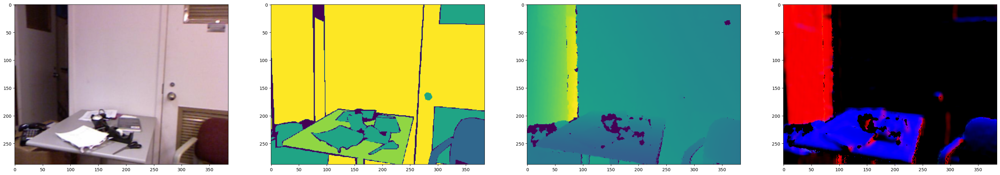

In [3]:
ds = NYUv2()
print(f"Total Number of Samples: {len(ds)}")
img, msk, dpt, nor = ds[0]

print(img.shape)
print(msk.shape)
print(dpt.shape)
print(nor.shape)

img_np = img.permute(1, -1, 0).numpy()
dpt_np = dpt.permute(1, -1, 0).numpy()
msk_np = msk.argmax(0).numpy()
nor_np = nor.permute(1, -1, 0).numpy()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (40, 10))

ax1.imshow(img_np)
ax2.imshow(msk_np)
ax3.imshow(dpt_np)
ax4.imshow(nor_np)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

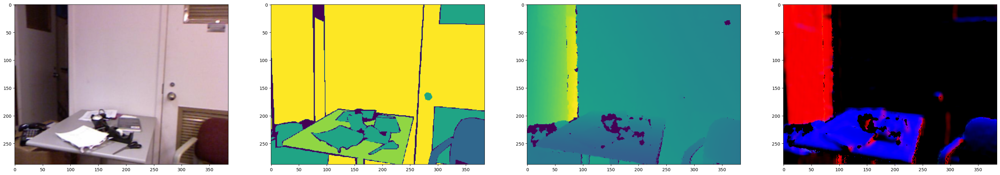

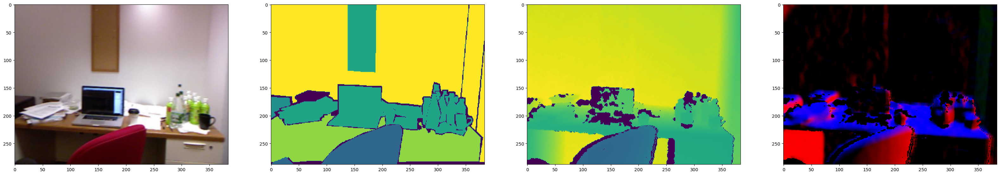

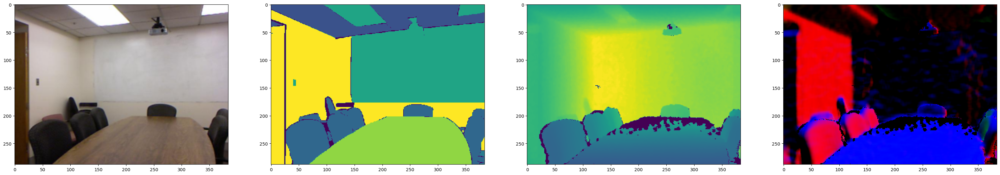

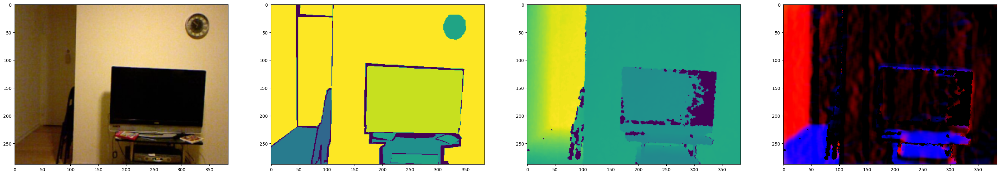

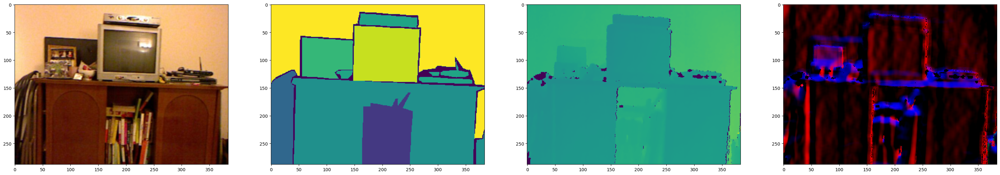

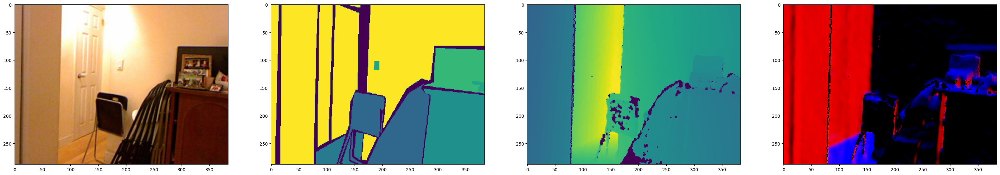

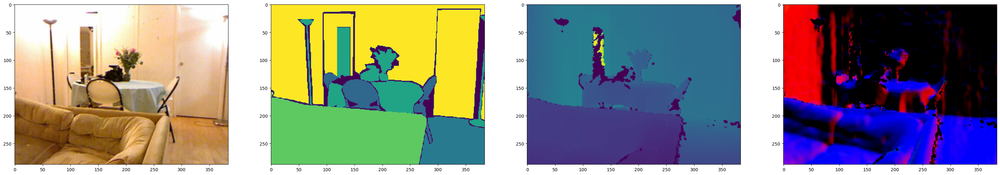

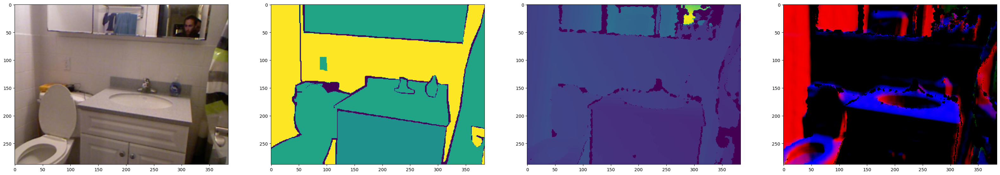

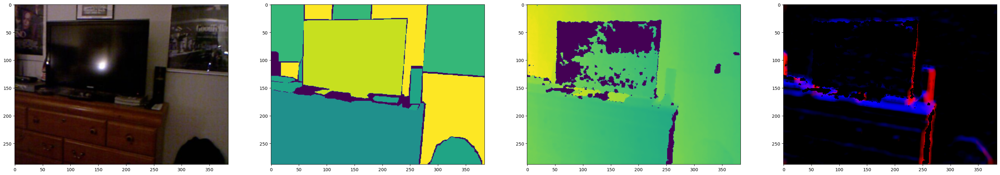

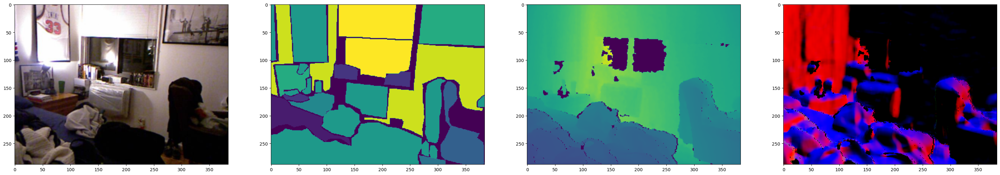

In [4]:
for idx in range(10):
    img, msk, dpt, nor = ds[idx]

    img_np = img.permute(1, -1, 0).numpy()
    dpt_np = dpt.permute(1, -1, 0).numpy()
    msk_np = msk.argmax(0).numpy()
    nor_np = nor.permute(1, -1, 0).numpy()

    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (40, 10))

    ax1.imshow(img_np)
    ax2.imshow(msk_np)
    ax3.imshow(dpt_np)
    ax4.imshow(nor_np)